In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path_title = "/content/drive/MyDrive/play/title.txt"
path_publisher = "/content/drive/MyDrive/play/publisher.txt"
path_desc = "/content/drive/MyDrive/play/app_desc.txt"
path_tag = "/content/drive/MyDrive/play/app_tag.txt"
path_class = "/content/drive/MyDrive/play/content_class.txt"
path_ratings = "/content/drive/MyDrive/play/ratings.txt"
path_agg_ratings = "/content/drive/MyDrive/play/agg_r.txt"
path_installs = "/content/drive/MyDrive/play/installs.txt"
path_nodes = "/content/drive/MyDrive/play/uniqueNodes.txt"
path_edges = "/content/drive/MyDrive/play/newEdge.txt"

In [ ]:
def listOfTuples(l1, l2):
    return list(map(lambda x, y:(x,y), l1, l2))

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd


G = nx.DiGraph()

nodes = pd.read_csv((path_nodes), sep="," , names=['nodeid','url'])
G.add_nodes_from(nodes['nodeid'])

edges_df = pd.read_csv((path_edges), sep="," , names=['source','target'])
edges = listOfTuples(edges_df['target'], edges_df['source'])
G.add_edges_from(edges)

fig = plt.figure(1, figsize=(200, 80), dpi=60)

nx.draw(G)  
#nx.draw_random(G)  
#nx.draw_circular(G)  
#nx.draw_spectral(G)  
#nx.draw_spring(G)  


In [ ]:
import pandas as pd
import numpy as np
import random
#!pip install clean-text

df_title = pd.read_csv((path_title), sep="," , names=['nodeid','title'])
df_pub = pd.read_csv((path_publisher), sep="," , names=['nodeid','Publisher'])
df_desc = pd.read_csv((path_desc), sep="," , names=['nodeid','Description'])
df_tag = pd.read_csv((path_tag), sep="," , names=['nodeid','Tag'])
df_class = pd.read_csv((path_class), sep="," , names=['nodeid','class'])
df_ratings = pd.read_csv((path_ratings), sep="|" , names=['nodeid','Ratings'])
df_agg = pd.read_csv((path_agg_ratings), sep="," , names=['nodeid','Aggregate_rating'])
df_installs = pd.read_csv((path_installs), sep="|" , names=['nodeid','Installs'])

df_fin = pd.DataFrame()

df_fin['nodeid'] = df_title['nodeid']
df_fin['Title'] = df_title['title']
df_fin['Description'] =df_desc['Description']
df_fin['App_tags'] = df_pub['Publisher']
df_fin['Publisher_info'] = df_tag['Tag']
df_fin['Class'] = df_class['class']
df_fin['Ratings'] = df_ratings['Ratings']
df_fin['Agg_Ratings'] = df_agg['Aggregate_rating']
df_fin['installs'] =  df_installs['Installs']


#print(df_fin[''].unique())


df_installs

#df_fin
df_fin

df_ratings

val = df_fin["installs"].isna().sum()
val

df_fin['installs'] = df_fin['installs'].str.replace(r"[\"\',]", '')
df_fin['Agg_Ratings'] = df_fin['Agg_Ratings'].str.replace(r"[\"\',]", '')
df_fin['Ratings'] = df_fin['Ratings'].str.replace(r"[\"\',]", '')

df_fin['Title'] = df_fin['Title'].str.replace(r"[\"\',]", '')
df_fin['Publisher_info'] = df_fin['Publisher_info'].str.replace(r"[\"\',]", '')
df_fin['Class'] = df_fin['Class'].str.replace(r"[\"\',]", '')

df_fin

df_fin['installs'] = df_fin['installs'].str.replace(r"[\"\',]", '')
df_fin['Agg_Ratings'] = df_fin['Agg_Ratings'].str.replace(r"[\"\',]", '')
df_fin['Ratings'] = df_fin['Ratings'].str.replace(r"[\"\',]", '')

df_fin['installs'] = df_fin['installs'].str.replace('\W', '')
df_fin['Agg_Ratings'] = df_fin['Agg_Ratings'].str.replace('\W', '')
df_fin['Ratings'] = df_fin['Ratings'].str.replace('\W', '')

df_fin['Ratings'] = df_fin['Ratings'].replace(np.nan, 0)
#df_fin['installs'] = df_fin['installs'].astype(np.int64)
df_fin['Agg_Ratings'] = df_fin['Agg_Ratings'].astype(np.int64)
df_fin['Ratings'] = df_fin['Ratings'].astype(np.int64)

df_fin['installs'].unique()
df_fin['Agg_Ratings'].unique()
df_fin['Ratings'].unique()
valnew1 = df_fin.loc[df_fin['installs'].str.contains("Varieswithdevice",na=False ,case=False)]
valnew1

##Handling Nan
df_fin.at[630,'installs']= random.randint(2000, 100000)
df_fin['installs'] = df_fin['installs'].astype(np.int64)



df_fin = df_fin.set_index('nodeid')

In [ ]:
!pip install clean-text
#!pip install cleantext
from cleantext import clean

def clean_all(uncleanlist):
  cleandata =[]
  for txt in uncleanlist:
    data = clean(
        txt,
        fix_unicode=True,
        lower=True,
        no_line_breaks=True,
        no_urls=True,
        no_emails=True,
        no_phone_numbers=True,
        no_numbers=True,
        no_digits=True,
        no_currency_symbols=True,
        no_punct=True,
        replace_with_punct='',
        replace_with_url='<URL>',
        replace_with_email='<EMAIL>',
        replace_with_phone_number='<PHONE>',
        replace_with_number='<NUMBER>',
        replace_with_digit='0',
        replace_with_currency_symbol='<CUR>',
        lang='en',
        )
    cleandata.append(data)

  return cleandata



     |████████████████████████████████| 170 kB 5.4 MB/s 
     |████████████████████████████████| 64 kB 2.1 MB/s 
  Created wheel for ftfy: filename=ftfy-6.0.3-py3-none-any.whl size=41933 sha256=2547cd42f16da03b88acb9b9eb899bc1851fda6804aaf7edcc59a88385882d7e
  Stored in directory: /root/.cache/pip/wheels/19/f5/38/273eb3b5e76dfd850619312f693716ac4518b498f5ffb6f56d
  Created wheel for emoji: filename=emoji-1.6.1-py3-none-any.whl size=169314 sha256=6d414094b161244141d63f55ac3c167a6b88df1f87d60d17162329a8699611d5
  Stored in directory: /root/.cache/pip/wheels/ea/5f/d3/03d313ddb3c2a1a427bb4690f1621eea60fe6f2a30cc95940f
Successfully built ftfy emoji


Since the GPL-licensed package `unidecode` is not installed, using Python's `unicodedata` package which yields worse results.


In [ ]:
#Cleaning text removing URLS emails and other special characters and converted everything to lower case.

unclean_text = df_desc['Description'].tolist()
desc_clean = clean_all(unclean_text)
len(desc_clean)
#len(unclean_text)

780

In [ ]:
df_desc['desc_clean'] = desc_clean
df_desc

,nodeid,Description,desc_clean
0,0,The best Wikipedia experience on your Mobile d...,the best wikipedia experience on your mobile d...
1,1,also called app is one of the best media pla...,also called app is one of the best media playe...
2,2,integrate directly into your WhatsApp sticke...,integrate directly into your whatsapp stickers...
3,3,Meet our NEW version Better and fasterFree mob...,meet our new version better and fasterfree mob...
4,4,Lark player is the it can play all major form...,lark player is the it can play all major forma...
...,...,...,...
775,775,Send any images in any format webp png etc fr...,send any images in any format webp png etc fro...
776,776,Convert mp4 to mp3 video to audio cut video an...,convert mp0 to mp0 video to audio cut video an...
777,777,PicShot photo editor app comes with many one t...,picshot photo editor app comes with many one t...
778,778,SPARKvue is a popular data collection visualiz...,sparkvue is a popular data collection visualiz...


In [ ]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
#tokenize and tag the card text
card_docs = [TaggedDocument(doc.split(' '), [i]) 
             for i, doc in enumerate(df_desc.desc_clean)]
#display the tagged docs
card_docs
model = Doc2Vec(vector_size=64, min_count=1, epochs = 200)
#instantiate model
model = Doc2Vec(vector_size=64, window=4, min_count=1, workers=8, epochs = 200)
#build vocab
model.build_vocab(card_docs)
#train model
model.train(card_docs, total_examples=model.corpus_count
            , epochs=model.epochs)

In [ ]:
import numpy as np

card2vec = [model.infer_vector((df_desc['desc_clean'][i].split(' '))) 
            for i in range(0,len(df_desc['desc_clean']))]
card2vec
card2VecRandomVectors = model.infer_vector(["system", "response"])
#Create a list of lists
dtv_emb= np.array(card2vec).tolist()

In [ ]:
df_features = pd.DataFrame.from_records(dtv_emb)
df_features.insert(0, 'nodeid', df_desc['nodeid'])

df_features = df_features.set_index("nodeid")
#df_embeddings

df_features

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63
nodeid,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2.479965,-2.008987,-0.189449,0.387117,3.814055,0.449340,-0.552046,1.629732,-0.813899,-0.527563,0.150182,-2.092273,0.145388,-4.209907,0.851479,-1.659287,0.083983,-0.940806,0.210060,-0.824862,7.066846,-0.990666,2.183714,-1.808474,-6.560450,3.951882,-4.319405,3.389573,2.772435,1.807120,-1.549456,-2.070958,-0.522940,0.954524,-2.383478,0.672099,2.367417,-4.927461,-1.338024,2.620352,2.228189,2.577655,2.723470,-0.177737,4.447359,0.409500,0.593540,-2.668199,0.089786,1.030850,-3.799006,4.072633,-1.754026,2.813715,-5.533445,0.115355,-0.752486,1.341159,2.546839,-3.559945,0.854369,-2.988546,-2.600260,-4.642269
1,-0.625734,1.130057,-4.900340,-5.338940,3.146576,-1.343050,3.389084,1.315860,-0.690048,0.906691,-0.118941,-3.020281,3.176831,1.175649,6.807623,-1.430421,-1.817857,-1.370017,-4.596508,-2.885803,1.094494,-1.385218,3.049489,0.557242,-1.528725,0.431823,2.185081,0.022551,3.420045,0.112930,-1.691315,3.634943,-0.743528,-2.025650,-1.845300,1.255745,1.195700,-3.960883,-1.310518,-1.425082,-0.098999,-3.535421,-2.564056,-0.347537,2.783893,0.402792,-0.827306,0.039492,-4.787188,0.667437,-2.608949,0.298189,-2.994150,-0.324251,-0.542863,2.973331,-3.810359,-5.016979,-1.063455,-4.138626,0.205668,-4.178463,4.079243,-2.410540
2,0.991579,-4.190679,-1.627150,-3.334687,2.831470,-2.260525,-5.683429,-0.742047,2.353619,-1.558722,1.207068,-1.314524,2.554625,-6.282546,1.940949,-5.736915,1.245322,0.630279,-0.685190,-3.077218,3.317283,-0.058592,1.987742,-0.156807,-2.736737,1.160440,-0.694910,-0.274602,-1.427398,1.602498,-3.022486,-2.537952,2.918901,1.007055,-4.045491,3.922949,0.489018,-2.860304,1.598134,-3.875061,-1.475301,2.011571,1.707552,3.463685,-0.254562,1.205861,-3.774862,-2.656790,-1.104311,5.255671,0.514454,0.816320,1.012411,3.335696,-0.008314,-3.896811,1.666027,4.111811,4.693839,1.423872,-1.803608,-1.462403,0.842618,-0.648351
3,-0.501025,-3.047779,-1.339279,-0.894793,5.837844,-1.879070,0.215675,0.225996,2.195211,-0.078754,1.810316,-8.087090,1.866675,0.927886,3.455862,-3.972677,-0.735807,4.009176,-5.332883,-2.286759,3.221781,-7.297052,-1.166079,-0.662127,-4.165999,3.671042,0.739724,-0.308999,-0.414124,-0.129562,-5.219573,0.073586,0.142476,1.803073,-3.265121,2.134180,4.089364,-2.133519,-1.897367,-1.775105,0.140775,2.984864,-2.581932,-2.461895,1.799207,-4.151303,3.443645,5.190252,2.093046,-1.726599,-2.119825,0.594293,-1.980113,-3.391140,-0.268521,2.120877,2.467148,-2.724250,2.366321,-6.954614,3.648640,0.871875,2.288813,-3.606605
4,-1.620072,0.744105,-4.538043,-4.816767,5.439351,-1.357045,2.907934,0.504821,1.050350,2.209936,-0.068169,-3.352001,-4.917751,0.734902,2.603517,-3.218675,-0.427940,-3.196311,-4.647645,2.255006,2.479289,-4.209496,3.294220,-1.041163,-1.464026,0.228088,-2.484615,-1.316703,2.246975,2.034794,-2.129302,2.112888,0.671364,-0.888372,0.033867,2.304243,-1.200022,-1.827565,0.743462,-2.148982,0.228380,-1.183601,-1.612282,-3.060316,0.838051,0.819873,-1.903850,-0.764431,-1.164361,2.313092,-6.406651,1.904753,-3.258521,0.966171,-1.026655,6.656807,-0.489650,-3.868695,-0.157975,1.744479,2.198345,-0.871146,3.943982,-2.933062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
775,-3.888280,-2.576957,-5.976705,-1.803300,4.163029,-5.889692,-1.235354,-1.578358,0.793003,-0.247489,1.432387,0.753468,3.572053,-0.604565,-5.972244,-3.575944,-3.848906,0.624174,-8.526762,-2.938146,3.166635,-0.244273,4.563471,0.377485,-4.485096,3.684553,-1.567983,0.240975,3.410060,5.730983,-1.853528,-2.041178,5.153857,0.266280,-2.581670,5.460006,0.992203,1.080266,-0.141646,-1.807517,-0.437357,5.264203,1.256687,2.080275,0.40

In [ ]:
s = df_fin.App_tags.value_counts().index[:4]
def categ(x,s):
    if x in s:
        return x
    else : 
        return "Others"

df_fin['broad_genre']= df_fin.App_tags.apply(lambda x : categ(x,s))

In [ ]:
from sklearn import preprocessing

df_fin_new = df_fin.drop('Title', 1)
df_fin_new = df_fin_new.drop('Description', 1)
df_fin_new
cols = ['App_tags','Class', 'Publisher_info','broad_genre']
df_fin_new[cols] = df_fin_new[cols].astype('category')
df_fin_new.info()
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
# Encode labels in column 'species'.
df_fin_new['App_tags']= label_encoder.fit_transform(df_fin_new['App_tags'])
df_fin_new['Class']= label_encoder.fit_transform(df_fin_new['Class'])
df_fin_new['Publisher_info']= label_encoder.fit_transform(df_fin_new['Publisher_info'])
df_fin_new['broad_genre']= label_encoder.fit_transform(df_fin_new['broad_genre'])
df_fin_new

#df_fin_new
df_fin_new

<class 'pandas.core.frame.DataFrame'>
Int64Index: 780 entries, 0 to 779
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   App_tags        780 non-null    category
 1   Publisher_info  780 non-null    category
 2   Class           780 non-null    category
 3   Ratings         780 non-null    int64   
 4   Agg_Ratings     780 non-null    int64   
 5   installs        780 non-null    int64   
 6   broad_genre     780 non-null    category
dtypes: category(4), int64(3)
memory usage: 54.1 KB


,App_tags,Publisher_info,Class,Ratings,Agg_Ratings,installs,broad_genre
nodeid,,,,,,,
0,6,448,0,667888,45,50000000,2
1,20,477,0,70273,48,1000000,1
2,29,336,3,152136,46,10000000,2
3,13,270,0,796800,45,50000000,2
4,20,214,3,2679619,46,100000000,1
...,...,...,...,...,...,...,...
775,11,400,0,28065,44,5000000,0
776,34,178,0,376036,48,10000000,2
777,23,232,0,290706,45,10000000,3


In [ ]:
df_features['label'] = df_fin_new['broad_genre']
feature_names = set(df_features.columns) - {"nodeid", "label"}
num_features = len(feature_names)
print ("num_features:", num_features)
num_classes = set(df_features['label'].tolist())
print("num_classes:", num_classes)

num_features: 64
num_classes: {0, 1, 2, 3, 4}


In [ ]:
df_fin_new

,App_tags,Publisher_info,Class,Ratings,Agg_Ratings,installs,broad_genre
nodeid,,,,,,,
0,6,448,0,667888,45,50000000,2
1,20,477,0,70273,48,1000000,1
2,29,336,3,152136,46,10000000,2
3,13,270,0,796800,45,50000000,2
4,20,214,3,2679619,46,100000000,1
...,...,...,...,...,...,...,...
775,11,400,0,28065,44,5000000,0
776,34,178,0,376036,48,10000000,2
777,23,232,0,290706,45,10000000,3


In [ ]:
from sklearn.preprocessing import MinMaxScaler


scaler = MinMaxScaler()
df_fin_new['Ratings'] = scaler.fit_transform(df_fin_new['Ratings'].values.reshape(-1,1))
df_fin_new['Agg_Ratings'] = scaler.fit_transform(df_fin_new['Agg_Ratings'].values.reshape(-1,1))
df_fin_new['installs'] = scaler.fit_transform(df_fin_new['installs'].values.reshape(-1,1))
#from sklearn.preprocessing import OrdinalEncoder
#ord_enc = OrdinalEncoder()
#df_fin_new["Publisher_info"] = ord_enc.fit_transform(df_fin_new["Publisher_info"].values.reshape(-1,1))


#et(df_fin_new['Publisher_info'])

In [ ]:
import pandas as pd
import keras
from keras import models
from keras.layers import Embedding, Dense, Flatten
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import sklearn
from sklearn.preprocessing import MinMaxScaler
%matplotlib inline 


def nn_embedding_network(df_x,df_y):
  embedding_size = 3
  model = models.Sequential()
  model.add(Embedding(input_dim = 6, output_dim = embedding_size, input_length = 1, name="embedding"))
  model.add(Flatten())
  model.add(Dense(50, activation="relu"))
  model.add(Dense(15, activation="relu"))
  model.add(Dense(1))
  model.compile(loss = "mse", optimizer = "adam", metrics=["accuracy"])
  model.fit(x = df_x, y=df_y , epochs = 50, batch_size = 4)
  return model

In [ ]:
def get_embeddings(model_name):
  layer = m1.get_layer('embedding')
  output_embeddings = layer.get_weights()
  output_embeddings
  return output_embeddings


In [ ]:
m1 = nn_embedding_network(df_fin_new['Agg_Ratings'].to_numpy(),df_fin_new['broad_genre'].to_numpy())
m2 = nn_embedding_network(df_fin_new['Ratings'].to_numpy(),df_fin_new['broad_genre'].to_numpy())
m3 = nn_embedding_network(df_fin_new['installs'].to_numpy(),df_fin_new['broad_genre'].to_numpy())
m4 = nn_embedding_network(df_fin_new['Class'].to_numpy(),df_fin_new['broad_genre'].to_numpy())
#m5 = nn_embedding_network(df_fin_new['App_tags'].to_numpy(),df_fin_new['broad_genre'].to_numpy())





In [ ]:
e_agg = get_embeddings(m1)

output_embeddings_df = pd.DataFrame(e_agg[0])
output_embeddings_df.columns = ['embedding_1', 'embedding_2', 'embedding_3']
output_embeddings_df

len(e_agg[0])

6

In [ ]:
train, validate, test = \
              np.split(df_features.sample(frac=1, random_state=42), 
                       [int(.6*len(df_features)), int(.8*len(df_features))])
              
train
validate
test

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,label
nodeid,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
768,1.528290,-8.042517,-2.829984,1.057994,3.357818,-3.724739,-3.500376,-0.317138,1.447130,-0.561176,0.312249,-1.037054,3.411862,3.111063,1.222986,-3.432405,-2.550217,2.514612,-0.315533,-2.508970,0.889675,-0.243265,0.156924,-2.413872,0.932483,0.321181,-2.541477,2.993901,-2.358836,0.816664,-0.290150,-0.310932,2.436740,-4.441604,-1.561875,4.146101,3.150137,-4.292458,-1.117996,2.020844,-2.752392,3.360371,-3.664893,0.610977,-0.534791,-3.050864,3.638449,5.047298,1.281432,4.107167,-2.031694,1.661296,3.189934,-1.868399,-1.480738,4.452638,1.091612,-1.533707,2.780657,1.846295,-0.594995,-4.328063,-1.551186,-5.575974,4
721,-1.070475,-9.422244,-4.734871,1.389665,-1.080822,0.169081,-2.395623,1.703053,0.651210,-2.526381,-0.130644,-0.289961,2.632704,-2.948643,0.520014,-5.623015,0.241723,-3.935212,-7.401641,-0.270572,1.693600,-1.717424,2.127813,2.866178,0.565835,4.462889,-3.138695,-1.438242,-3.972122,0.856298,1.474513,-2.026371,8.409193,2.769138,1.726830,3.076495,0.256252,-1.034135,-2.039412,3.013104,-4.572031,-1.324282,-3.436440,2.302859,1.371444,6.661721,-2.198405,3.963063,1.217822,-0.002792,-0.550207,-3.563692,-4.252431,1.986128,-0.071911,-2.101947,-6.508596,1.824201,3.122506,-0.982120,-2.770305,0.607053,3.839194,-0.975875,3
703,-2.971695,2.166883,-6.283781,-3.978018,4.508227,1.286888,-1.518757,4.349836,3.071432,0.834728,0.682938,-1.761700,3.156317,3.096388,1.137300,0.500910,-3.254016,1.636972,-0.634820,-0.983590,2.559443,-3.291288,4.016795,-0.357309,1.014947,-0.720883,4.180727,-4.514958,2.521498,-1.866846,1.354430,0.510627,4.746149,2.583439,-4.215096,1.544442,3.169679,-1.148963,-0.364407,1.799279,-1.217479,-2.775234,2.650803,0.895347,1.884276,5.183656,1.313050,-1.336806,-2.633738,4.077236,-0.337882,0.576885,1.764075,-0.946392,3.886167,1.794866,-0.142837,-3.650895,1.116586,0.588218,1.430704,1.104537,4.298958,0.433996,2
619,-1.513282,-5.142766,-2.433484,-6.805304,2.446600,-0.668550,-5.790990,0.572025,1.400759,-2.827079,-2.298238,-2.968937,5.076869,1.762679,-1.137597,-4.747637,-1.646738,1.272301,-0.702323,-1.924680,6.813945,2.075001,3.756964,-1.136256,-4.200888,2.591351,1.545926,-1.531243,1.137041,0.796030,-0.802419,-1.808647,0.208614,1.243428,-1.642898,4.536437,0.376384,-2.989512,-4.271434,1.468775,-1.184860,-0.868231,3.433208,0.351284,2.652717,1.050679,-0.403391,-1.609787,-3.714610,4.877094,0.606196,2.862945,1.908886,0.582170,0.758767,-1.629574,-0.086372,-3.511586,2.185812,-2.914510,1.532848,-0.646713,-1.889030,-1.161030,2
667,-6.058554,-4.508811,-7.051464,-2.448941,1.527254,0.989890,-3.698737,0.459542,0.759300,1.625016,0.408902,4.093699,1.101142,-1.613730,0.626294,-1.793697,0.805304,-1.112427,-1.570990,-1.020938,0.963729,-0.103911,3.823217,-1.590788,-4.321676,0.672552,-1.162442,-0.010012,1.236201,5.776661,4.953971,-0.930327,0.133955,-2.234078,-0.510254,2.785179,3.096631,-1.777254,2.369600,-2.173784,1.105521,0.909166,-0.544189,1.781768,3.809702,-1.317934,-1.702737,-4.248216,-0.658345,1.756181,-0.810730,0.121224,0.265111,0.005468,-3.489319,3.210789,2.993784,0.544184,2.580456,-1.385436,-0.982214,1.626053,4.155087,-3.078230,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,-1.667011,-4.244270,-1.972273,1.215612,6.333230,-3.621420,1.422025,0.927275,-0.748165,-0.071140,-1.109370,-0.421944,1.748567,-3.456563,1.795415,-4.462602,-4.233311,0.837289,1.842625,-0.471807,2.896491,-1.142465,-1.804156,1.424566,-0.011104,1.464009,-1.719445,-2.687639,-0.257217,3.205158,2.461245,-0.638547,4.644773,0.940806,-0.330577,2.664198,1.657302,2.090018,1.720774,-0.143652,-4.267596,1.672029,0.44668

In [ ]:
x_train = train[feature_names].to_numpy()
x_valid = validate[feature_names].to_numpy()
x_test = test[feature_names].to_numpy()
# Create train and test targets as a numpy array.
y_train = train["label"]
y_valid = validate["label"]
y_test = test["label"]

set(y_test)

{0, 1, 2, 3, 4}

In [ ]:
from sklearn import preprocessing, feature_extraction, model_selection

target_encoding = preprocessing.LabelBinarizer()
train_targets = target_encoding.fit_transform(y_train)
val_targets = target_encoding.transform(y_valid)
test_targets = target_encoding.transform(y_valid)

In [ ]:
#!pip install stellargraph
import pandas as pd
import os
import stellargraph as sg
from stellargraph.mapper import DirectedGraphSAGENodeGenerator
from stellargraph.layer import DirectedGraphSAGE

from tensorflow.keras import layers, optimizers, losses, metrics, Model
from sklearn import preprocessing, feature_extraction, model_selection
from stellargraph import datasets
from IPython.display import display, HTML
import matplotlib.pyplot as plt
%matplotlib inline
from stellargraph import StellarDiGraph

no_cat_g = StellarDiGraph({"node": df_features}, {"links": edges_df})
print(no_cat_g.info())

batch_size = 256
in_samples = [5, 2]
out_samples = [5, 2]

generator = DirectedGraphSAGENodeGenerator(no_cat_g, batch_size, in_samples, out_samples)
train_gen = generator.flow(y_train.index, train_targets, shuffle=True)

graphsage_model = DirectedGraphSAGE(
    layer_sizes=[64, 64], generator=generator, bias=False, dropout=0.2,
)

x_inp, x_out = graphsage_model.in_out_tensors()
prediction = layers.Dense(units=train_targets.shape[1], activation="softmax")(x_out)

##
model = Model(inputs=x_inp, outputs=prediction)
model.compile(
    optimizer=optimizers.Adam(lr=0.001),
    loss=losses.categorical_crossentropy,
    metrics=["acc"],
)

val_gen = generator.flow(y_valid.index, val_targets)

history = model.fit(
    train_gen, epochs=200, validation_data=val_gen, verbose=2, shuffle=False
)

StellarDiGraph: Directed multigraph
 Nodes: 780, Edges: 2778

 Node types:
  node: [780]
    Features: float32 vector, length 65
    Edge types: node-links->node

 Edge types:
    node-links->node: [2778]
        Weights: all 1 (default)
        Features: none


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/200
2/2 - 3s - loss: 1.6927 - acc: 0.1218 - val_loss: 1.6940 - val_acc: 0.0833 - 3s/epoch - 1s/step
Epoch 2/200
2/2 - 0s - loss: 1.6436 - acc: 0.1517 - val_loss: 1.6280 - val_acc: 0.1282 - 387ms/epoch - 194ms/step
Epoch 3/200
2/2 - 0s - loss: 1.5937 - acc: 0.2607 - val_loss: 1.5688 - val_acc: 0.2756 - 486ms/epoch - 243ms/step
Epoch 4/200
2/2 - 1s - loss: 1.5429 - acc: 0.3462 - val_loss: 1.5246 - val_acc: 0.4679 - 654ms/epoch - 327ms/step
Epoch 5/200
2/2 - 1s - loss: 1.5115 - acc: 0.4765 - val_loss: 1.4755 - val_acc: 0.5192 - 709ms/epoch - 355ms/step
Epoch 6/200
2/2 - 1s - loss: 1.4743 - acc: 0.5256 - val_loss: 1.4339 - val_acc: 0.5577 - 691ms/epoch - 345ms/step
Epoch 7/200
2/2 - 1s - loss: 1.4462 - acc: 0.5299 - val_loss: 1.4034 - val_acc: 0.5769 - 698ms/epoch - 349ms/step
Epoch 8/200
2/2 - 1s - loss: 1.4187 - acc: 0.5385 - val_loss: 1.3766 - val_acc: 0.5769 - 613ms/epoch - 307ms/step
Epoch 9/200
2/2 - 1s - loss: 1.3975 - acc: 0.5385 - val_loss: 1.3521 - val_acc: 0.5769 - 596ms

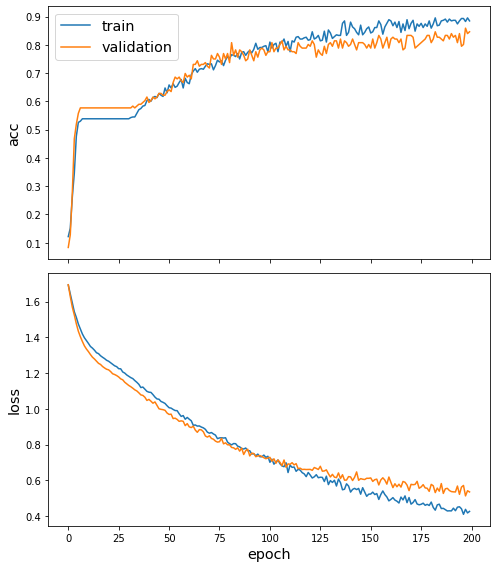

In [ ]:
sg.utils.plot_history(history)

In [ ]:
loss, accuracy, f1_score, precision, recall = model.evaluate(Xtest, ytest, verbose=0)

In [ ]:
test_nodes = test.index
test_mapper = generator.flow(y_test.index, test_targets)
test_predictions = model.predict(test_mapper)
test_predictions

test_node_predictions = target_encoding.inverse_transform(test_predictions)
#print(test_node_predictions)
fin = label_encoder.inverse_transform(test_node_predictions);
fin.shape

(156,)

In [ ]:
df_test_preds = pd.DataFrame()
df_test_preds.insert(0, 'preds', fin.tolist())
actual_lab = label_encoder.inverse_transform(test['label'].tolist());
df_test_preds.insert(1, 'actual',actual_lab)

df_test_preds.iloc[17]

preds     Others
actual    Others
Name: 17, dtype: object

In [ ]:
all_nodes = df_features.index
embedding_model = Model(inputs=x_inp, outputs=x_out)
all_mapper = generator.flow(df_features.index, df_features['label'])


embedding_model = Model(inputs=x_inp, outputs=x_out)
emb = embedding_model.predict(all_mapper)
emb.shape


(780, 64)

In [ ]:
#!pip install umap-learn
#!pip install umap-learn[plot]

import pandas as pd
import umap
import umap.plot

# Used to get the data
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

# Some plotting libraries
import matplotlib.pyplot as plt
%matplotlib notebook
from bokeh.plotting import show, save, output_notebook, output_file
from bokeh.resources import INLINE
output_notebook(resources=INLINE)



embedding = umap.UMAP(n_components=2, metric='cosine').fit(emb)




<IPython.core.display.Javascript object>

In [ ]:
embedding.embedding_.shape

(780, 2)

In [ ]:
df_fin_new['broad_genre']

NameError: ignored

In [ ]:
f = umap.plot.points(embedding, labels=df_fin_new['broad_genre'])


<IPython.core.display.Javascript object>

Dimensionality reduction and plotting embeddings in 2D space to check for cluster seperation.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


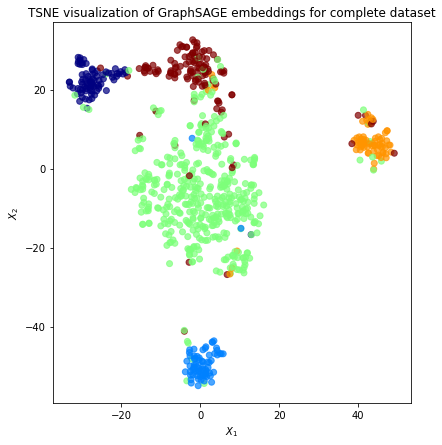

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import pandas as pd
import numpy as np


X = emb
y = np.argmax(target_encoding.transform(df_features['label']), axis=1)


if X.shape[1] > 2:
    transform = TSNE  # PCA

    trans = transform(n_components=2)
    emb_transformed = pd.DataFrame(trans.fit_transform(X), index=df_features.index)
    emb_transformed["label"] = y
else:
    emb_transformed = pd.DataFrame(X, index=df_features.index)
    emb_transformed = emb_transformed.rename(columns={"0": 0, "1": 1})
    emb_transformed["label"] = y

alpha = 0.7

fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(
    emb_transformed[0],
    emb_transformed[1],
    c=emb_transformed["label"].astype("category"),
    cmap="jet",
    alpha=alpha,
)
ax.set(aspect="equal", xlabel="$X_1$", ylabel="$X_2$")
plt.title(
    "{} visualization of GraphSAGE embeddings for complete dataset".format(transform.__name__)
)
plt.show()



## Experimental section..

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df_fin_new['Ratings'] = scaler.fit_transform(df_fin_new['Ratings'].values.reshape(-1,1))
df_fin_new['Agg_Ratings'] = scaler.fit_transform(df_fin_new['Agg_Ratings'].values.reshape(-1,1))
df_fin_new['installs'] = scaler.fit_transform(df_fin_new['installs'].values.reshape(-1,1))

df_fin_new

,App_tags,Publisher_info,Class,Ratings,Agg_Ratings,installs,broad_genre
nodeid,,,,,,,
0,6,448,0,0.004421,0.90,0.004999,2
1,20,477,0,0.000465,0.96,0.000099,1
2,29,336,3,0.001007,0.92,0.000999,2
3,13,270,0,0.005274,0.90,0.004999,2
4,20,214,3,0.017737,0.92,0.009999,1
...,...,...,...,...,...,...,...
775,11,400,0,0.000186,0.88,0.000499,0
776,34,178,0,0.002489,0.96,0.000999,2
777,23,232,0,0.001924,0.90,0.000999,3


In [ ]:
df_fin_new

,App_tags,Publisher_info,Class,Ratings,Agg_Ratings,installs,broad_genre
nodeid,,,,,,,
0,6,448,0,0.004421,0.90,0.004999,2
1,20,477,0,0.000465,0.96,0.000099,1
2,29,336,3,0.001007,0.92,0.000999,2
3,13,270,0,0.005274,0.90,0.004999,2
4,20,214,3,0.017737,0.92,0.009999,1
...,...,...,...,...,...,...,...
775,11,400,0,0.000186,0.88,0.000499,0
776,34,178,0,0.002489,0.96,0.000999,2
777,23,232,0,0.001924,0.90,0.000999,3


In [ ]:
df_fin_new['broad_genre'].unique()

array([2, 1, 4, 0, 3])

In [ ]:
feature_names = set(df_fin_new.columns) - {"nodeid", "broad_genre"}
num_features = len(feature_names)
print ("num_features:", num_features)
num_classes = set(df_fin_new['broad_genre'].tolist())
print("num_classes:", num_classes)

num_features: 6
num_classes: {0, 1, 2, 3, 4}


In [ ]:
x_train = train[feature_names].to_numpy()
x_valid = validate[feature_names].to_numpy()
# Create train and test targets as a numpy array.
y_train = train["broad_genre"]
y_valid = validate["broad_genre"]

x_valid

dfg = pd.DataFrame(x_train)
dfg

,0,1,2,3,4,5
0,11.0,0.0,0.000250,0.000999,296.0,0.74
1,29.0,3.0,0.002268,0.000999,459.0,0.78
2,20.0,0.0,0.005584,0.000999,466.0,0.92
3,32.0,0.0,0.000152,0.000499,452.0,0.80
4,2.0,0.0,0.000006,0.000009,268.0,0.50
...,...,...,...,...,...,...
463,0.0,1.0,0.008786,0.009999,68.0,0.88
464,32.0,3.0,0.005429,0.009999,101.0,0.90
465,32.0,0.0,0.000085,0.000099,230.0,0.88
466,22.0,0.0,0.000138,0.000099,81.0,0.94
